In [1]:
import scanpy as sc
import pandas as pd

path = "/Users/lsimon/OneDrive/Miko/Helmholtz/Schiller/outputs/Bleo/data/From_GEO/"

hires = sc.read(path + "GSE141259_HighResolution_rawcounts.mtx.gz").T
genes = pd.read_csv(path + "GSE141259_HighResolution_genes.txt.gz", header = None)
hires.var_names = genes[0]
info = pd.read_csv(path + "GSE141259_HighResolution_cellinfo.csv.gz", index_col = 0)
hires.obs = info

whole = sc.read(path + "GSE141259_WholeLung_rawcounts.mtx.gz").T
genes = pd.read_csv(path + "GSE141259_WholeLung_genes.txt.gz", header = None)
whole.var_names = genes[0]
info = pd.read_csv(path + "GSE141259_WholeLung_cellinfo.csv.gz", index_col = 0)
whole.obs = info

mouse = hires.concatenate(whole)

mouse.var_names = [i.upper() for i in mouse.var_names]
whole.var_names = [i.upper() for i in whole.var_names]

human = sc.read("/Users/lsimon/OneDrive/Miko/Helmholtz/Schiller/outputs/MultiModal/data/Human_lungs/schiller/schiller.h5ad")

both_species = human.concatenate(whole)

sc.pp.recipe_zheng17(both_species, n_top_genes=3001)

sc.pp.pca(both_species, n_comps= 100)

both_species

In [85]:
#sc.write("/Users/lsimon/OneDrive/Miko/Helmholtz/Schiller/human_mouse_merged.h5ad", both_species)

In [2]:
both_species = sc.read("/Users/lsimon/OneDrive/Miko/Helmholtz/Schiller/human_mouse_merged.h5ad")

In [5]:
from bbtnn.tnn_v3 import *

In [32]:
%%time
model = TNN(k = 50, batch_size = 32, epochs = 100, n_epochs_without_progress = 10, verbose = 2)
model.fit(X = both_species, batch_name = "batch")
embedding = model.transform(both_species)

Calculating MNNs...
Processing datasets (0, 1)
10362 cells defined as MNNs
Calculating KNNs
7772 cells defined as KNNs
Reorder
Training neural network
Epoch 1/100
324/324 - 4s - loss: 0.8566
Epoch 2/100
324/324 - 2s - loss: 0.4308
Epoch 3/100
324/324 - 2s - loss: 0.3445
Epoch 4/100
324/324 - 2s - loss: 0.3043
Epoch 5/100
324/324 - 2s - loss: 0.2789
Epoch 6/100
324/324 - 2s - loss: 0.2639
Epoch 7/100
324/324 - 2s - loss: 0.2154
Epoch 8/100
324/324 - 2s - loss: 0.2207
Epoch 9/100
324/324 - 2s - loss: 0.2003
Epoch 10/100
324/324 - 2s - loss: 0.1927
Epoch 11/100
324/324 - 2s - loss: 0.1879
Epoch 12/100
324/324 - 2s - loss: 0.1730
Epoch 13/100
324/324 - 2s - loss: 0.1592
Epoch 14/100
324/324 - 2s - loss: 0.1706
Epoch 15/100
324/324 - 2s - loss: 0.1551
Epoch 16/100
324/324 - 2s - loss: 0.1608
Epoch 17/100
324/324 - 2s - loss: 0.1547
Epoch 18/100
324/324 - 2s - loss: 0.1463
Epoch 19/100
324/324 - 2s - loss: 0.1435
Epoch 20/100
324/324 - 2s - loss: 0.1439
Epoch 21/100
324/324 - 2s - loss: 0.13

In [34]:
sc.set_figure_params(dpi = 150, dpi_save = 300)
sc.set_figure_params
sc.settings.figdir = "/Users/lsimon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/figures/"

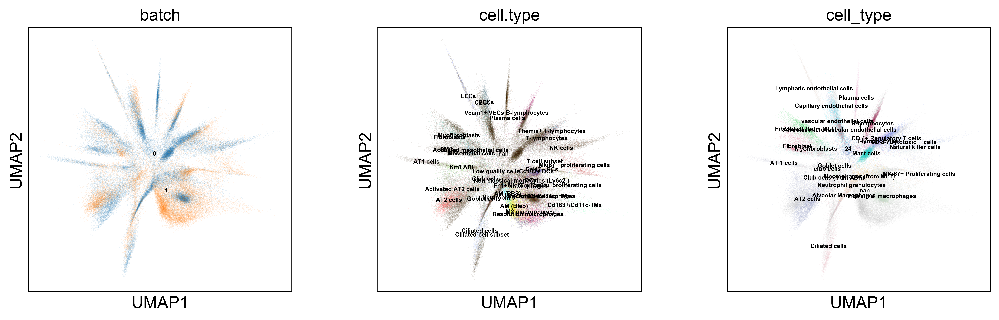

In [33]:
sc.pl.umap(both_species, color = ["batch", "cell.type", "cell_type"], legend_loc = "on data", legend_fontsize = 5, alpha = 0.1)

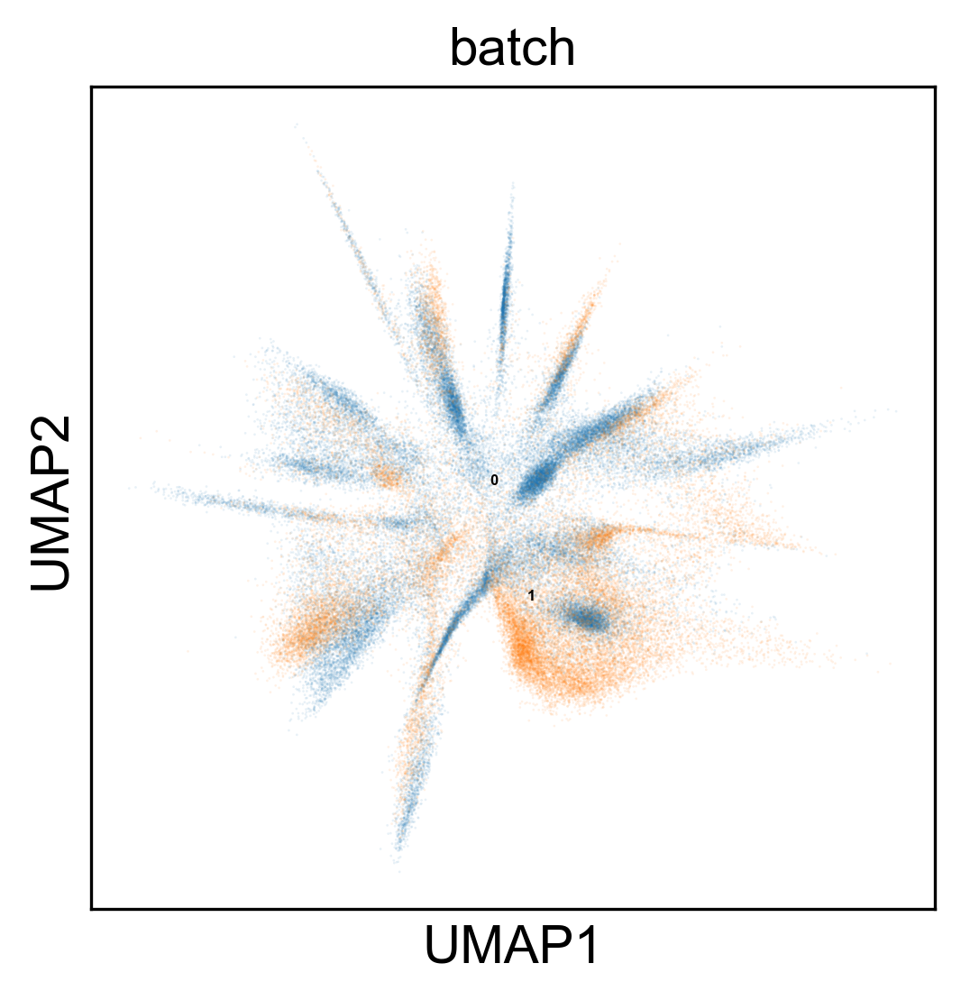

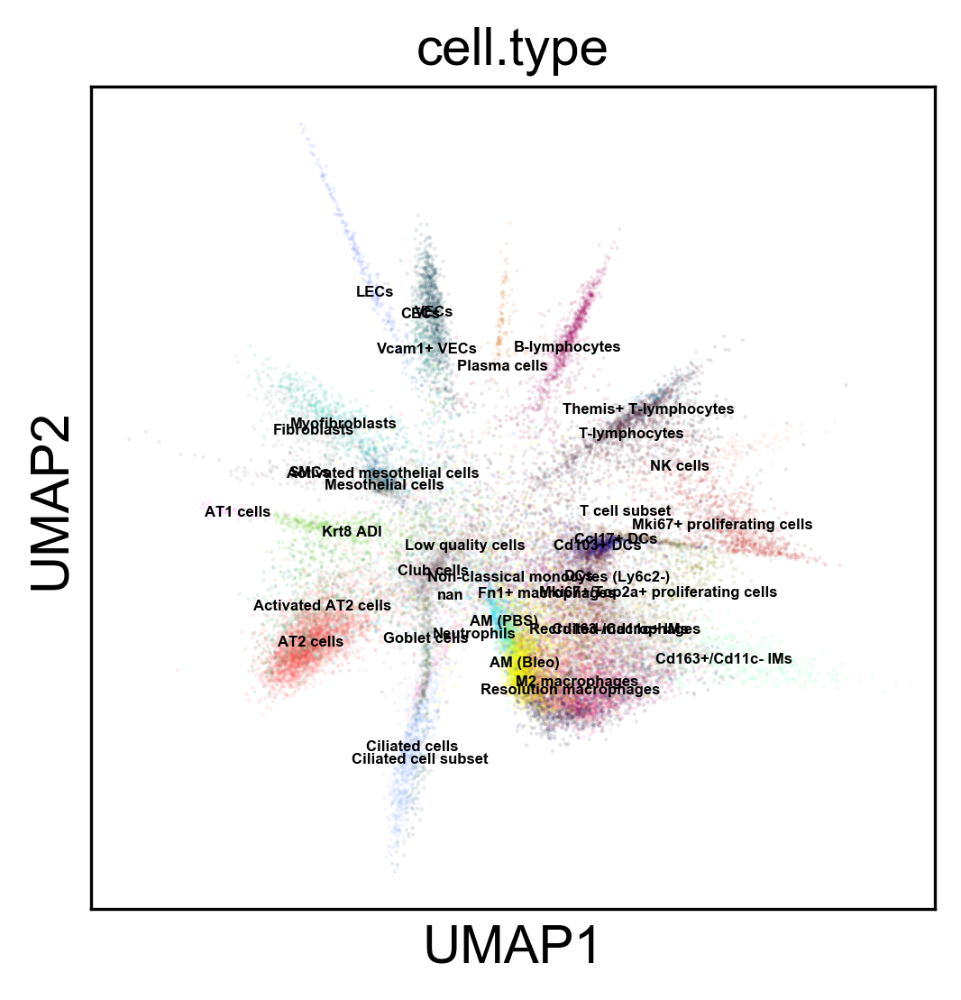

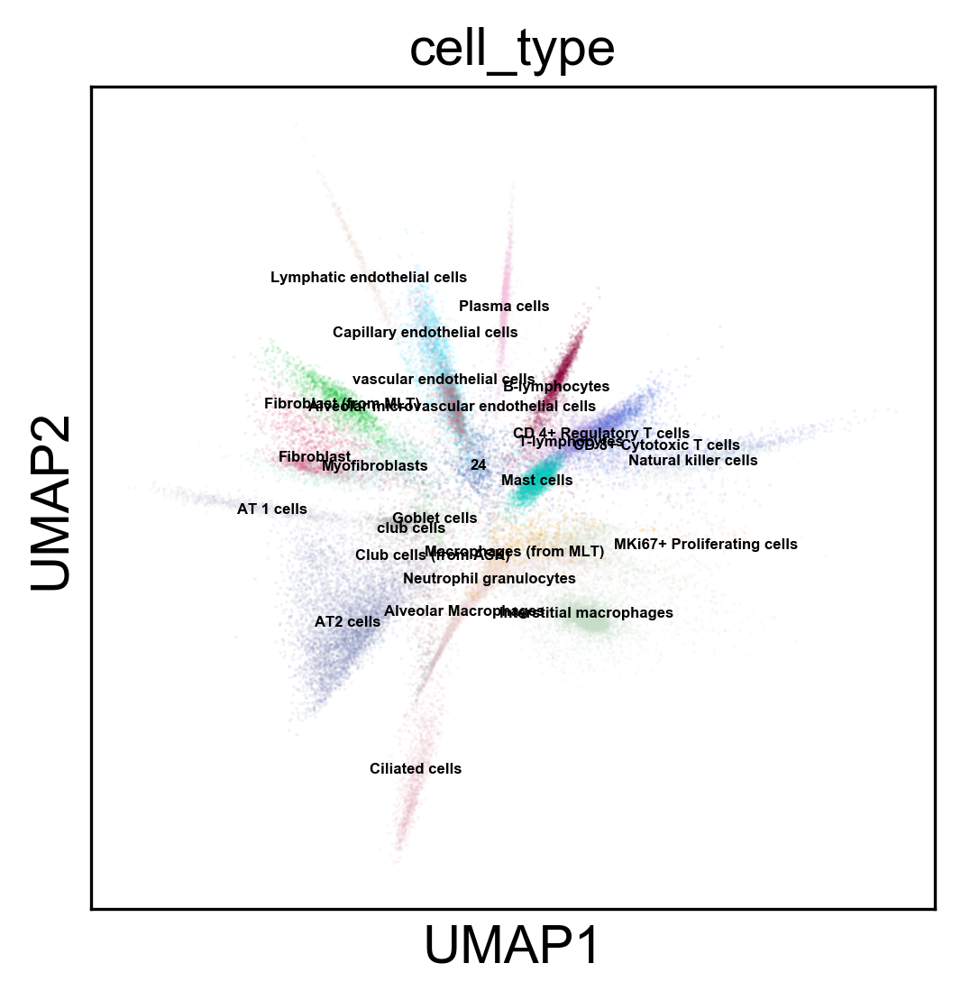

In [35]:
sc.pl.umap(both_species, color = "batch", legend_loc = "on data", legend_fontsize = 4, alpha = 0.1, save = "_both")
sc.pl.umap(both_species[both_species.obs["batch"] == "1"], color = "cell.type", legend_loc = "on data", legend_fontsize = 4, alpha = 0.1, save = "_mouse")
sc.pl.umap(both_species[both_species.obs["batch"] == "0"], color = "cell_type", legend_loc = "on data", legend_fontsize = 4, alpha = 0.1, save = "_human")

In [50]:
both_species.write("/Users/lsimon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/Lung_combined.h5ad")

In [62]:
from matplotlib import colors
import matplotlib.pyplot as plt
colorsComb = np.vstack([plt.cm.Reds(np.linspace(0, 1, 128)), plt.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

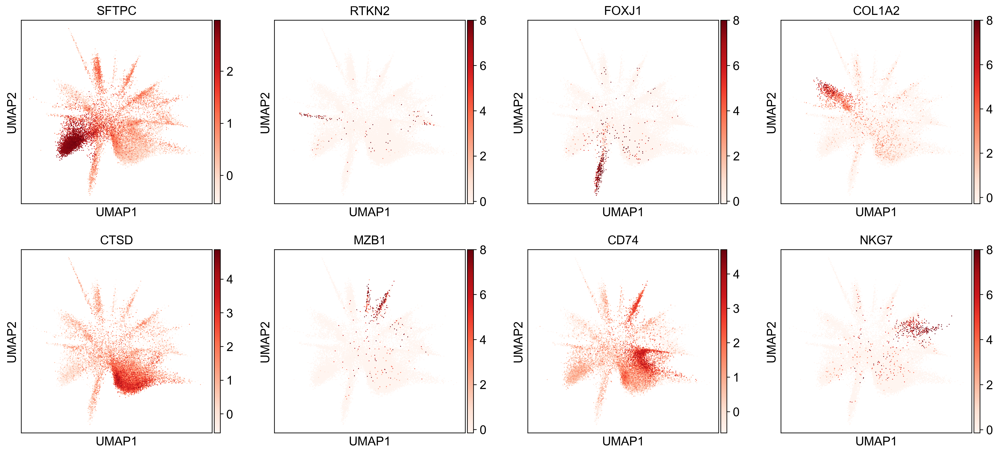

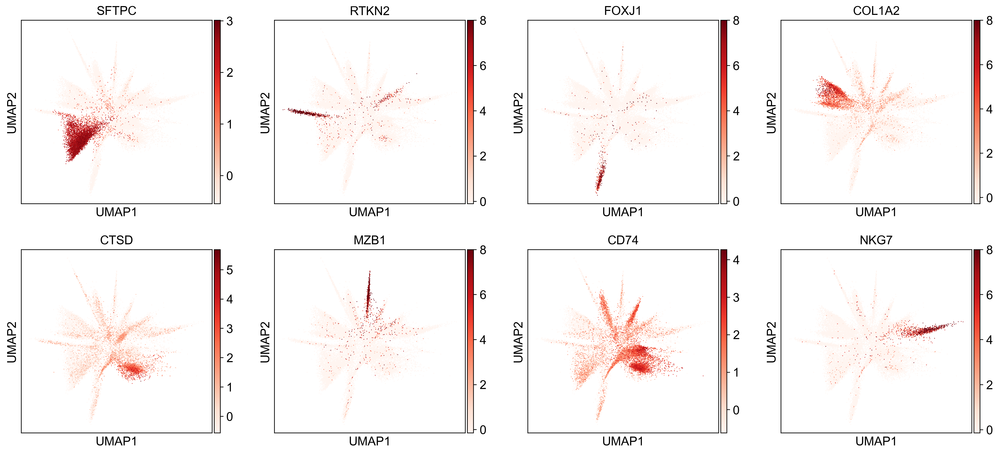

In [63]:
markers = ["SFTPC", "RTKN2", "FOXJ1", "COL1A2", "CTSD", "MZB1", "CD74", "NKG7"]
tmp = sc.pp.scale(both_species, copy = True, max_value = 8)
sc.pl.umap(tmp[tmp.obs["batch"] == "1"], color = markers, save = "_mouse_markers", cmap = mymap)
sc.pl.umap(tmp[tmp.obs["batch"] == "0"], color = markers, save = "_human_markers", cmap = mymap)

In [9]:
import hdbscan

... storing 'cluster' as categorical


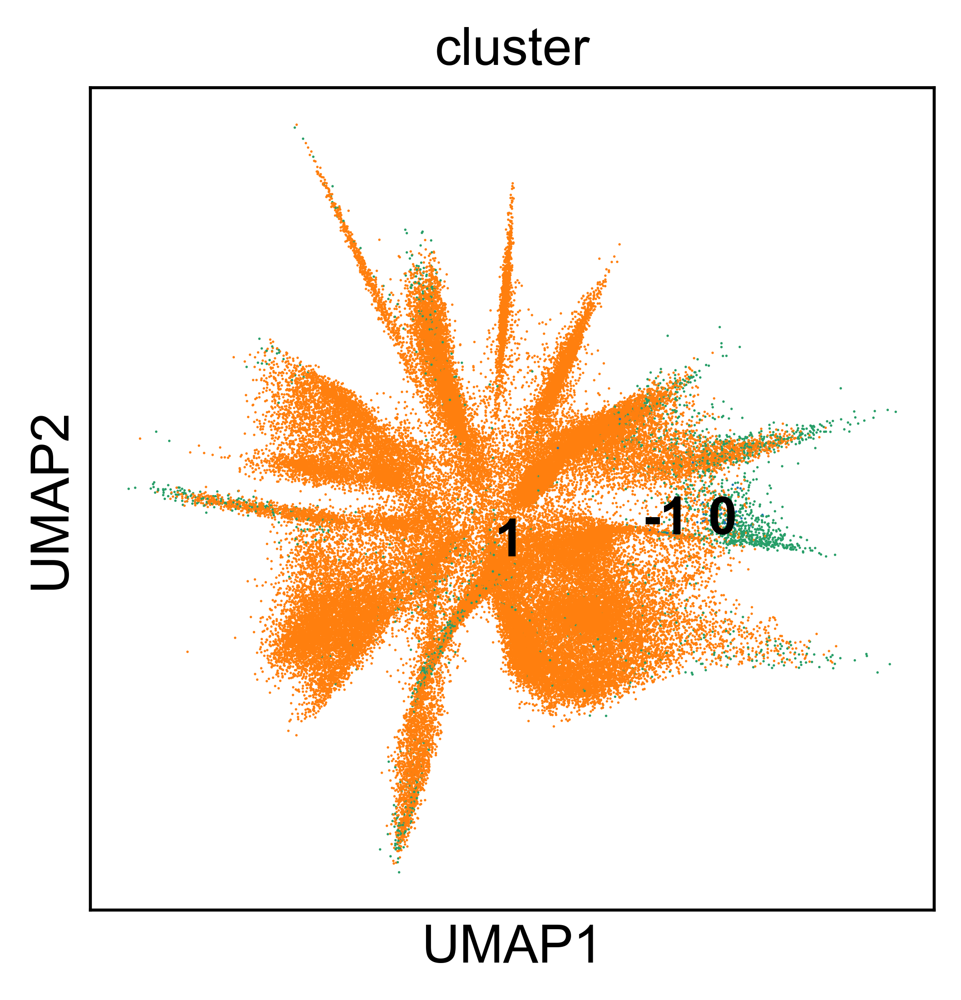

In [16]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=50, min_samples=5, cluster_selection_epsilon=0.1)
clusterer.fit(embedding)
both_species.obs["cluster"] = clusterer.labels_.astype("str")
sc.pl.umap(both_species, color = "cluster", legend_loc="on data")

In [21]:
from sklearn.mixture import BayesianGaussianMixture

C:\Users\lsimon\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\mixture\base.py:265: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
... storing 'cluster' as categorical


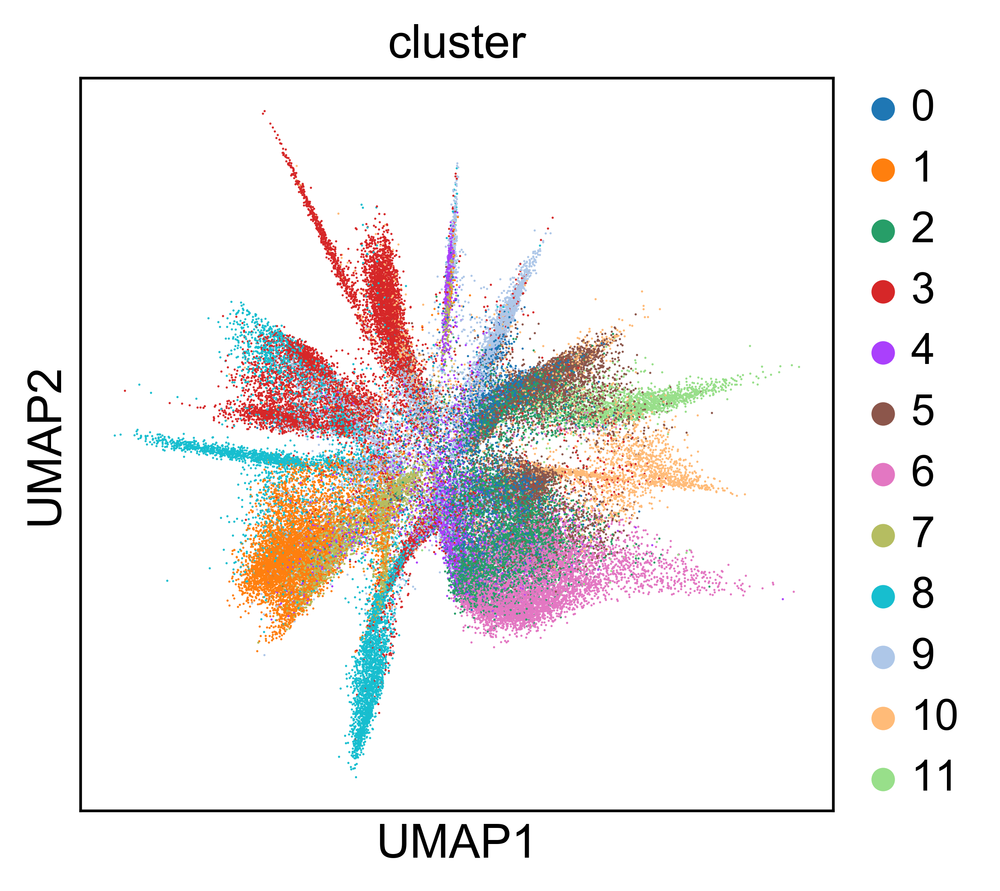

In [31]:
clusterer = BayesianGaussianMixture(n_components=12)
both_species.obs["cluster"] = clusterer.fit_predict(embedding).astype("str")
sc.pl.umap(both_species, color = "cluster")#, legend_loc="on data")

In [43]:
from sklearn.ensemble import RandomForestClassifier
X_human = both_species[both_species.obs["batch"] == "0"].obsm["X_umap"]
Y_human = both_species[both_species.obs["batch"] == "0"].obs["cell_type"]
rf = RandomForestClassifier()
rf.fit(X_human, np.array(Y_human))

C:\Users\lsimon\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [44]:
X_mouse = both_species[both_species.obs["batch"] == "1"].obsm["X_umap"]
Y_mouse = both_species[both_species.obs["batch"] == "1"].obs["cell.type"]
preds = rf.predict(X_mouse)

In [45]:
labels = pd.DataFrame({"predicted_labels":preds, "mouse_labels":Y_mouse})

combined=[]
preds = preds.tolist()
Y_mouse = Y_mouse.tolist()
for i in range(0, labels.shape[0]):
    combined.append(preds[i] + "|" + Y_mouse[i])

pd.Index(combined).value_counts().head(50)

Interstitial macrophages|AM (Bleo)                              2883
AT2 cells|AT2 cells                                             2609
Interstitial macrophages|M2 macrophages                         2205
Interstitial macrophages|Resolution macrophages                 1688
Interstitial macrophages|DCs                                    1336
Interstitial macrophages|Recruited macrophages                   913
CD 4+ Regulatory T cells|T-lymphocytes                           818
B-lymphocytes|B-lymphocytes                                      780
Interstitial macrophages|Cd163-/Cd11c+ IMs                       682
Ciliated cells|Ciliated cells                                    648
AT2 cells|Activated AT2 cells                                    620
vascular endothelial cells|VECs                                  599
Interstitial macrophages|Cd103+ DCs                              583
Interstitial macrophages|AM (PBS)                                544
MKi67+ Proliferating cells|Mki67+ 

In [49]:
labels.to_csv("/Users/lsimon/OneDrive/Miko/UTHealth/projects/BatchBalancedTriplets/figures/Lung human mouse analysis/mouse_human_prediction.csv")